#1.Read File Or Create Random

In [ ]:
from google.colab import files
files.upload()

{}

In [ ]:
!pip -q install ortools

In [ ]:
import numpy as np
from ortools.sat.python import cp_model
from ortools.linear_solver import pywraplp
import pandas as pd
import random

In [ ]:
def create_random(s):
    N = 10
    D = 10
    a =  random.randint(1, N // 5)
    b = a + random.randint(1, N - a)
    F = np.full((N+1, D+1), 0)
    for person in range(N):
        for day in range(D):
            F[person, day] = random.choices([0, 1], weights=[100,s])[0]
    return N, D, a, b, F

In [ ]:
def read(filename):
    with open(filename, 'r') as inpfile:
        n, d, a, b = [int(x) for x in inpfile.readline().split()]
        F = np.full((n+1, d+1), 0)
        for staff in range(n):
            temp = [int(x) for x in inpfile.readline().split()[:-1]]
            for day in temp:
                F[staff, day-1] = 1
    return n, d, a, b, F


In [ ]:
def rest_red(val):
  if val == "Rest": 
    color = 'red'
  elif val == "Nigh":
    color = 'yellow'
  else: 
    color = 'white'
  return 'background-color: %s' % color 

#2.MIP


##Input

In [ ]:
n, d, a, b, F = read("data1.inp")
# n,d,a,b,F = create_random(20)


In [ ]:

solver = pywraplp.Solver.CreateSolver('CBC')

infinity = solver.infinity()

# creat dictionary store the var
X = {}
for staff in range(n):
    for day in range(d):
        for shift in range(1, 5):
            X[staff, day, shift] = solver.IntVar(
                0, 1, f'X[{staff}, {day}, {shift}]')

Z = solver.IntVar(0, int(d/2) + 1, "Z")

# Create constraint

# moi nguoi moi ngay chi lam 1 ca va lam buoi dem thi hom sau khong phai lam
for staff in range(n):
    for day in range(d):
        if F[staff, day] == 0:
            constraint = solver.Constraint(1, 1)
            for i in range(1, 5):
                constraint.SetCoefficient(X[staff, day, i], 1)
            if day != 0:
                constraint.SetCoefficient(X[staff, day - 1, 4], 1)

# ngay nghi thi dc nghi
for staff in range(n):
    for day in range(d):
        if F[staff, day] == 1:
            constraint = solver.Constraint(0, 0)
            for shift in range(1, 5):
                constraint.SetCoefficient(X[staff, day, shift], 1)

# moi buoi phai co tu a den b nguoi
for day in range(d):
    for shift in range(1, 5):
        # tao constraint trong moi a < constraint < b
        constraint = solver.Constraint(a, b)
        for staff in range(n):  # chay nguoi
            # constraint them bien X[person, day, buoi] voi he so la 1
            constraint.SetCoefficient(X[staff, day, shift], 1)

# Z la so buoi dem ma mot nguoi phai lam nhieu nhat

for staff in range(n):
    final_constraint = solver.Constraint(-infinity, 0)
    for day in range(d):
        final_constraint.SetCoefficient(X[staff, day, 4], 1)
        final_constraint.SetCoefficient(Z, -1)

# creat objective
solver.Minimize(Z)

# solve
status = solver.Solve()




In [ ]:
  if status == pywraplp.Solver.OPTIMAL:
    print("Minimize value of Y: ", solver.Objective().Value())
    S = np.full((n, d, 5), 0)
    for staff in range(n):
        for day in range(d):
            for shift in range(1, 5):
                S[staff, day, shift] = int(X[staff, day, shift].solution_value())

    shifts = np.array(["Morning", "Noon", "Afternoon", "Night"])
    days = np.array([f"Day {day}" for day in range(d)])
    day_shifts = np.sum(S, axis=0)
    day_shifts_solution = pd.DataFrame(data=day_shifts[:, 1:].T, index=shifts, columns=days)
  else:
    print("No optimal solutioin")
   




Minimize value of Y:  17.0


##Data Visualize

In [ ]:
 day_shifts_solution.style.background_gradient(cmap='Greens')

,Day 0,Day 1,Day 2,Day 3,Day 4,Day 5,Day 6,Day 7,Day 8,Day 9,Day 10,Day 11,Day 12,Day 13,Day 14,Day 15,Day 16,Day 17,Day 18,Day 19,Day 20,Day 21,Day 22,Day 23,Day 24,Day 25,Day 26,Day 27,Day 28,Day 29,Day 30,Day 31,Day 32,Day 33,Day 34,Day 35,Day 36,Day 37,Day 38,Day 39,Day 40,Day 41,Day 42,Day 43,Day 44,Day 45,Day 46,Day 47,Day 48,Day 49,Day 50,Day 51,Day 52,Day 53,Day 54,Day 55,Day 56,Day 57,Day 58,Day 59,Day 60,Day 61,Day 62,Day 63,Day 64,Day 65,Day 66,Day 67,Day 68,Day 69,Day 70,Day 71,Day 72,Day 73,Day 74,Day 75,Day 76,Day 77,Day 78,Day 79,Day 80,Day 81,Day 82,Day 83,Day 84,Day 85,Day 86,Day 87,Day 88,Day 89
Morning,101,57,57,58,57,60,63,57,59,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,62,58,57,58,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,62,58,58,59,57,57,58,59,57,57,57,57,58,57,57,57,57,57,57,57,57,57,58,57,57,59,57,58,57,57,57,57,59,57,57,57,57,58,58,57,57,64
Noon,58,57,57,57,57,57,58,57,58,59,57,57,57,58,57,57,57,57,57,57,57,57,57,57,57,58,57,57,57,57,58,58,57,57,57,57,57,57,57,57,57,58,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,58,57,57,59,57,57,59,57,57,57,57,58,57,58,58,57,57,57,57,57,57,57,57,57,57,57,58,57,57,57
Afternoon,58,58,57,62,57,57,58,57,57,57,57,57,57,57,58,57,57,58,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,58,57,58,57,57,57,57,57,57,57,57,57,57,57,57,57,58,57,57,57,57,57,58,57,57,57,58,57,57,57,57,57,57,57,57,57,57,57,57,57
Night,57,58,57,57,57,57,57,58,57,57,57,57,58,57,57,57,57,57,57,57,57,57,57,58,57,57,57,57,57,57,57,57,58,57,57,57,57,57,58,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,58,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,58,57,57,57,57,58,57,58,57,57


In [ ]:
col = np.array([f"Per {staff}" for staff in range(n)])
row = days
data2 = np.full((d,n),"Rest")
for r in range(d):
  for c in range(n):
    for shift in range(1,5):
      if S[c,r,shift] == 1:
        data2[r,c] = shifts[shift-1]
        break

In [ ]:

solution2 = pd.DataFrame(data = data2, index = row, columns = col)
solution2.style.applymap(rest_red)



# 3.CP



##Input

In [ ]:
n,d,a,b,F = read("data1.inp")

In [ ]:




# Khởi tạo biến
model = cp_model.CpModel()

X = {}
for staff in range(n):
    for day in range(d):
        for kip in range(1,5):
            X[staff, day, kip] = model.NewIntVar(
                0, 1, f"x[{staff},{day},{kip}]")
''' X[person,day,kip] -> 0 nếu ngày day kíp kip người person không làm
                        -> 1 nếu ngày day kíp kip người person làm '''

# 1 nhân viên làm nhiều nhất 1 ca. Nếu làm kíp đêm, hôm sau được nghỉ
for staff in range(n):
    for day in range(d):
        if F[staff, day] == 0:
            if day == 0:
                model.Add(sum([X[staff, day, kip]
                                for kip in range(1,5)]) == 1)
            else:
                model.Add(sum([X[staff, day, kip]
                                for kip in range(1,5)]) + X[staff, day - 1, 4] == 1)
        else:
            model.Add(sum([X[staff, day, kip] for kip in range(1,5)]) == 0)
# Mỗi kíp có A đến B người
for day in range(d):
    for kip in range(1,5):
        model.Add(sum([X[person, day, kip] for person in range(n)]) <= b)
        model.Add(sum([X[person, day, kip] for person in range(n)]) >= a)

# Mục tiêu : Số ca đêm nhiều nhất của 1 người -> min
max_ca_dem = model.NewIntVar(1, int(d/2) + 1, 'max_ca_dem')
for staff in range(n):
    model.Add(sum([X[staff, day, 4]
                    for day in range(d)]) - max_ca_dem <= 0)

model.Minimize(max_ca_dem)

solver = cp_model.CpSolver()
status = solver.Solve(model)


    


##Data Visualize

In [ ]:
# Đưa ra lời giải tối ưu
if status == cp_model.OPTIMAL:
  print("Min: ", solver.ObjectiveValue())
  S = np.full((n, d, 5), 0)
  for staff in range(n):
      for day in range(d):
          for shift in range(1, 5):
              S[staff, day, shift] = int(solver.Value(X[staff, day, shift]))

  shifts = np.array(["Morning", "Noon", "Afternoon", "Night"])
  days = np.array([f"Day {day}" for day in range(d)])
  day_shifts = np.sum(S, axis=0)
  day_shifts_solution = pd.DataFrame(data=day_shifts[:, 1:].T, index=shifts, columns=days)
  


Min:  1.0


In [ ]:
 day_shifts_solution.style.background_gradient(cmap='Greens')

,Day 0,Day 1,Day 2,Day 3,Day 4,Day 5,Day 6,Day 7,Day 8,Day 9,Day 10,Day 11,Day 12,Day 13,Day 14,Day 15,Day 16,Day 17
Morning,9,9,9,7,9,8,14,13,1,13,8,8,6,8,5,1,12,7
Noon,2,3,2,2,1,4,1,1,1,1,2,2,6,3,5,1,1,3
Afternoon,2,1,3,4,1,1,1,1,8,1,4,4,4,2,7,13,1,4
Night,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1


In [ ]:
col = np.array([f"Per {staff}" for staff in range(n)])
row = days
data2 = np.full((d,n),"Rest")
for r in range(d):
  for c in range(n):
    for shift in range(1,5):
      if S[c,r,shift] == 1:
        data2[r,c] = shifts[shift-1]
        break

In [ ]:
solution2 = pd.DataFrame(data = data2, index = row, columns = col)
solution2.style.applymap(rest_red)


,Per 0,Per 1,Per 2,Per 3,Per 4,Per 5,Per 6,Per 7,Per 8,Per 9,Per 10,Per 11,Per 12,Per 13,Per 14,Per 15,Per 16,Per 17,Per 18
Day 0,Noon,Afte,Morn,Morn,Rest,Morn,Morn,Morn,Morn,Nigh,Rest,Rest,Afte,Morn,Rest,Noon,Rest,Morn,Morn
Day 1,Noon,Morn,Nigh,Morn,Noon,Morn,Morn,Rest,Morn,Rest,Morn,Morn,Afte,Rest,Morn,Morn,Rest,Rest,Noon
Day 2,Afte,Noon,Rest,Morn,Afte,Morn,Morn,Morn,Rest,Morn,Morn,Rest,Noon,Morn,Afte,Morn,Morn,Nigh,Rest
Day 3,Noon,Afte,Afte,Morn,Morn,Morn,Rest,Morn,Morn,Rest,Morn,Rest,Noon,Afte,Afte,Morn,Nigh,Rest,Rest
Day 4,Nigh,Rest,Rest,Afte,Morn,Rest,Morn,Rest,Rest,Morn,Morn,Morn,Rest,Morn,Morn,Morn,Rest,Noon,Morn
Day 5,Rest,Afte,Noon,Morn,Rest,Morn,Morn,Morn,Rest,Morn,Morn,Rest,Morn,Noon,Noon,Nigh,Morn,Rest,Noon
Day 6,Morn,Morn,Morn,Morn,Afte,Nigh,Morn,Morn,Morn,Noon,Morn,Morn,Morn,Morn,Morn,Rest,Morn,Rest,Morn
Day 7,Morn,Morn,Morn,Morn,Morn,Rest,Morn,Morn,Morn,Morn,Morn,Nigh,Nigh,Morn,Morn,Morn,Rest,Afte,Noon
Day 8,Afte,Rest,Rest,Afte,Noon,Rest,Rest,Rest,Nigh,Afte,Afte,Rest,Rest,Morn,Afte,Afte,Afte,Rest,Afte
Day 9,Morn,Nigh,Morn,Morn,Morn,Morn,Morn,Rest,Rest,Morn,Morn,Rest,Morn,Morn,Morn,Morn,Afte,Noon,Morn




# 4.Heuristic


In [ ]:
def heuristic(n, d, a, b, F):
  global X
  numofnight = np.array([0 for _ in range(n)])  # number of nightshift each staff
  for day in range(d):
      markToday = np.copy(F[:,day][:n]) # mark staff off today
      markNextday = np.copy(F[:, day + 1][:n])  # mark staff will be leave the nextday
      #mark staff worked last night
      if day != 0:
          for staff in range(n):
              if X[staff,day-1,3] == 1:
                  markToday[staff] = 1
      cantworktoday = (markToday == 1).sum() # number of staff cannot work today
      cantworknextday = (markNextday == 1).sum() #number of staff cannot work nextday

      #Optimize number of staff work nightshift
      if select(n,cantworktoday,cantworknextday,a,b) == False:
          return -1
      else:
          minnighttoday,add = select(n,cantworktoday,cantworknextday,a,b)

      #Assign night shift
      staff_off_nextday = np.array([j for j in range(len(markNextday)) if markNextday[j] == 1 ])
      numnight_off_nextday = np.array([numofnight[i] for i in staff_off_nextday])
      remain = minnighttoday - add
      
      while add>0:
          tmp = np.argmin(numnight_off_nextday)
          X[staff_off_nextday[tmp],day,3] = 1
          numnight_off_nextday[tmp] += 1
          numofnight[staff_off_nextday[tmp]] += 1
          markToday[staff_off_nextday[tmp]] = 1
          add -= 1

      
      staff_canwork_today = np.array([i for i in range(len(markToday)) if markToday[i] != 1])
      numnight_canwork_today = np.array([numofnight[i] for i in staff_canwork_today])
      while remain>0:
          tmp = np.argmin(numnight_canwork_today)
          X[staff_canwork_today[tmp],day,3] = 1
          numnight_canwork_today[tmp] += 1
          numofnight[staff_canwork_today[tmp]] +=1
          markToday[staff_canwork_today[tmp]] = 1
          remain -= 1

      #Assign day-shift
      staff = 0
      shift = 0
      while staff < n and shift < 3:
          if markToday[staff] == 0:
              X[staff, day, shift] = 1
              markToday[staff] = 1
              staff += 1
              shift = (shift + 1) % 3
          else:
              staff += 1
  return max(numofnight)
  

In [ ]:
def select(n,cantworktoday,cantworknextday,a,b):
    x = 0
    y = 0
    check = True
    upperboundtoday = n - cantworktoday -3*a
    lowerboundtoday = n - cantworktoday - 3*b
    if lowerboundtoday > b or upperboundtoday < a:
        check = False
    else:
        x = max(lowerboundtoday,a)

    upperboundnextday = n - cantworknextday - x - 3*a
    lowerboundnextday = n - cantworknextday -x- 3*b
    if lowerboundnextday > b:
        z = lowerboundnextday -b
        x += z
    elif upperboundnextday < a:
        y = a - upperboundnextday
    else:
        y = 0
    if x > b or x < a or y > cantworknextday:
        check = False
    if check == False:
        return False
    else:
        return x,y

##Input

In [ ]:
n,d,a,b,F = read('input012.inp')

# n,d,a,b,F = create_random(2)
X = np.full((n,d,4),0)
kq = heuristic(n,d,a,b,F)

##Data Visualize

In [ ]:
print("MIN: ",kq)
if kq != -1:
  S = np.full((n, d, 5), 0)
  for staff in range(n):
      for day in range(d):
          for shift in range(4):
              S[staff, day, shift] = int(X[staff, day, shift])

  shifts = np.array(["Morning", "Noon", "Afternoon", "Night"])
  days = np.array([f"Day {day}" for day in range(d)])
  day_shifts = np.sum(S, axis=0)
  day_shifts_solution = pd.DataFrame(data=day_shifts[:, :4].T, index=shifts, columns=days)

MIN:  17


In [ ]:
 day_shifts_solution.style.background_gradient(cmap='Greens')

,Day 0,Day 1,Day 2,Day 3,Day 4,Day 5,Day 6,Day 7,Day 8,Day 9,Day 10,Day 11,Day 12,Day 13,Day 14,Day 15,Day 16,Day 17,Day 18,Day 19,Day 20,Day 21,Day 22,Day 23,Day 24,Day 25,Day 26,Day 27,Day 28,Day 29,Day 30,Day 31,Day 32,Day 33,Day 34,Day 35,Day 36,Day 37,Day 38,Day 39,Day 40,Day 41,Day 42,Day 43,Day 44,Day 45,Day 46,Day 47,Day 48,Day 49,Day 50,Day 51,Day 52,Day 53,Day 54,Day 55,Day 56,Day 57,Day 58,Day 59,Day 60,Day 61,Day 62,Day 63,Day 64,Day 65,Day 66,Day 67,Day 68,Day 69,Day 70,Day 71,Day 72,Day 73,Day 74,Day 75,Day 76,Day 77,Day 78,Day 79,Day 80,Day 81,Day 82,Day 83,Day 84,Day 85,Day 86,Day 87,Day 88,Day 89
Morning,73,58,57,57,57,58,57,57,58,58,58,57,57,58,58,58,57,58,58,57,57,57,58,57,57,58,57,57,57,58,58,58,58,58,58,58,57,59,57,58,57,58,57,57,57,59,57,58,57,58,58,57,58,57,57,59,57,58,58,57,58,57,57,59,57,57,59,58,57,58,57,57,57,58,58,58,58,57,58,57,57,58,57,58,57,57,58,58,57,60
Noon,73,58,57,57,57,58,57,57,57,58,58,57,57,57,58,57,57,58,57,57,57,57,57,57,57,57,57,57,57,57,58,57,57,57,57,58,57,58,57,57,57,57,57,57,57,58,57,57,57,58,57,57,58,57,57,58,57,57,58,57,58,57,57,58,57,57,58,57,57,57,57,57,57,57,57,58,57,57,57,57,57,57,57,58,57,57,58,58,57,59
Afternoon,73,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,58,57,57,57,57,57,57,58,57,57,57,57,57,57,57,58,57,57,57,57,57,57,57,57,57,58,57,57,57,57,58,57,57,58,57,57,58,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,59
Night,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57


In [ ]:
col = np.array([f"Per {staff}" for staff in range(n)])
row = days
data2 = np.full((d,n),"Rest")
for r in range(d):
  for c in range(n):
    for shift in range(4):
      if S[c,r,shift] == 1:
        data2[r,c] = shifts[shift]
        break

In [ ]:
solution2 = pd.DataFrame(data = data2, index = row, columns = col)
solution2.style.applymap(rest_red)

# 5.Comparison

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

## Accuracy

###Import data ( Need to upload 'data_final_final.csv')

In [ ]:
data = pd.read_csv('data_final_final.csv',header = None)
running = data[:][1].values
accuracy = np.array([(100-i*100) for i in data[:][2].values])

###Draw chart

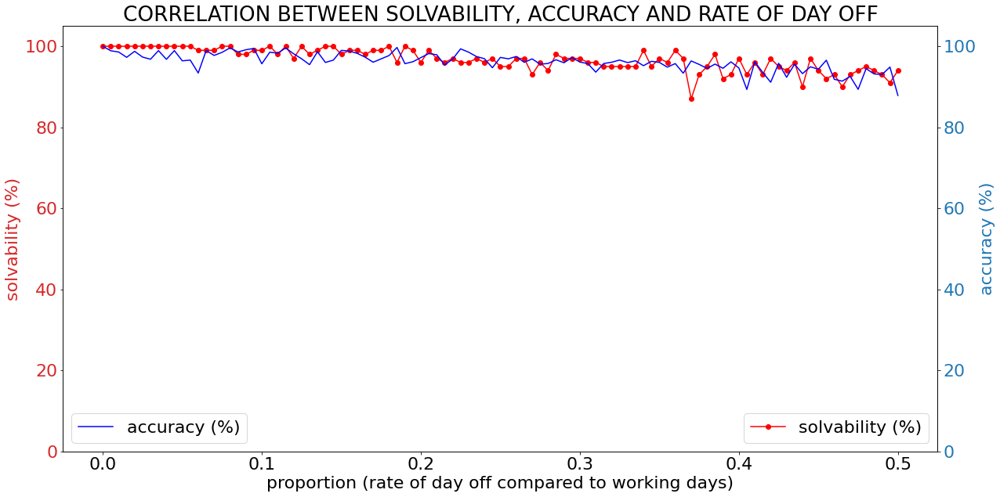

In [ ]:


matplotlib.rcParams.update({'font.size': 22})

proportion = np.arange(0 / 200, 101 / 200, 1 / 200)
fig, ax1 = plt.subplots(figsize = (20,10))
plt.title("CORRELATION BETWEEN SOLVABILITY, ACCURACY AND RATE OF DAY OFF")
color = 'tab:red'
ax1.set_xlabel('proportion (rate of day off compared to working days)')
ax1.set_ylabel('solvability (%)', color=color)
ax1.plot(proportion, running, 'r', marker ='o', label = 'solvability (%)')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set(ylim=(0, 105))
ax1.legend(loc = 'lower right')


ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('accuracy (%)', color=color)
ax2.plot(proportion, accuracy, 'b', label = 'accuracy (%)')
ax2.tick_params(axis='y', labelcolor=color)
ax2.set(ylim=(0, 105))
plt.legend(loc = 'lower left')
plt.savefig("accuracy.png")
plt.show()

##Running time

###Import data (Need to upload "time_compare_mip_heu_bigdata_d_n.csv" and "time_CP.csv")

In [ ]:
time_data_aws = pd.read_csv('time_compare_mip_heu_bigdata_d_n.csv')
time_data_cp = pd.read_csv('time_CP.csv')

###Data processing

In [ ]:
for i in range(len(time_data_aws['mip'])):
  if time_data_aws['mip'][i] == -1:
    time_data_aws['mip'][i] = None


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


###Draw chart 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: Second argument 'cp' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  # Remove the CWD from sys.path while we load stuff.


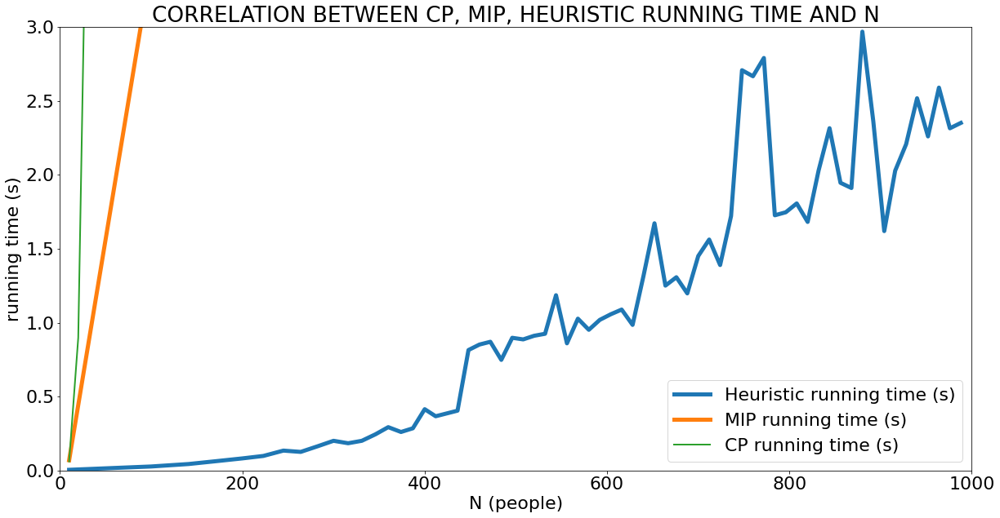

In [ ]:
matplotlib.rcParams.update({'font.size': 22})
fig, ax1 = plt.subplots(figsize = (20,10))
# ax1.set(ylim = (0,1000))
# ax1.set(xlim = (0,1000))
plt.title("CORRELATION BETWEEN CP, MIP, HEURISTIC RUNNING TIME AND N")
ax1.set_xlabel('N (people)')
ax1.set_ylabel('running time (s)')
ax1.plot('n','heu', data = time_data_aws, label = 'Heuristic running time (s)', linewidth = 5)
ax1.plot('n','mip', data = time_data_aws, label = 'MIP running time (s)', linewidth = 5)
plt.plot('n', 'cp', data = time_data_cp, label = "CP running time (s)", linewidth =2, ls = '-')
ax1.axis([0,1000,0,3])
plt.legend(loc = 'best')
plt.savefig("zoom.png")
plt.show()


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: Second argument 'cp' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  # Remove the CWD from sys.path while we load stuff.


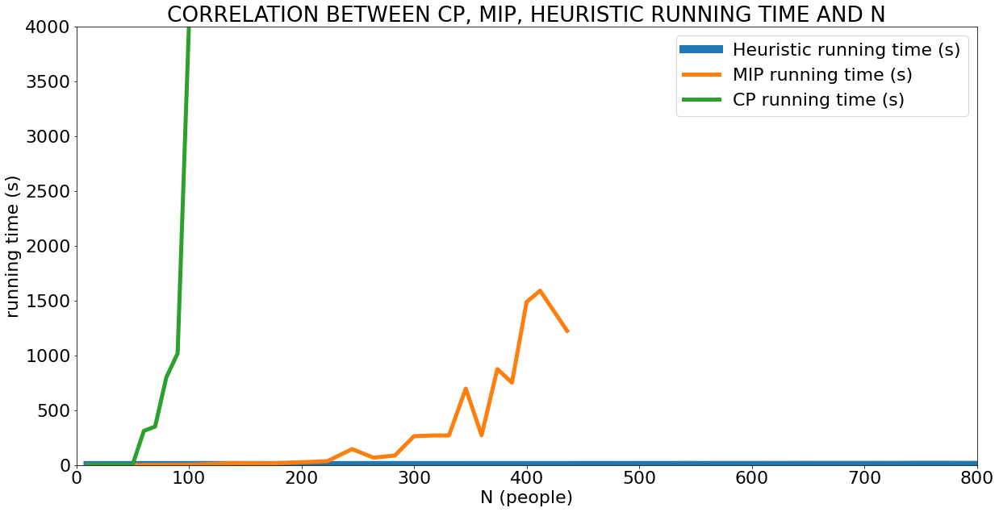

In [ ]:
matplotlib.rcParams.update({'font.size': 22})
fig, ax1 = plt.subplots(figsize = (20,10))
# ax1.set(ylim = (0,1000))
# ax1.set(xlim = (0,1000))
plt.title("CORRELATION BETWEEN CP, MIP, HEURISTIC RUNNING TIME AND N")
ax1.set_xlabel('N (people)')
ax1.set_ylabel('running time (s)')
ax1.plot('n','heu', data = time_data_aws, label = 'Heuristic running time (s)', linewidth = 10)
ax1.plot('n','mip', data = time_data_aws, label = 'MIP running time (s)', linewidth = 5)
plt.plot('n', 'cp', data = time_data_cp, label = "CP running time (s)", linewidth = 5)
ax1.axis([0,800,0,4000])
plt.legend(loc = 'best')
plt.savefig("normal.png")
plt.show()